# 1 AUTHOR
### Student Name: Jude Damian Sequeira 
### Student ID:220431413

# 2 Problem formulation

In this notebook,I am going to predict whether an audio file is recorded indoors or outdoors area. The MLEndLS Sounds dataset is used which consists of 2500 audio files. Also the MLEndLS.csv file is used to train the models using its labels where Indoors implies 1/True and Outdoors Implies 0/False.

 The First task of this problem is to load the dataset from the google drive followed by checking if there are any broken audio files to be removed. Later the features of audio files namely Power,Pitcg-Mean,Pitch-StandardDeviation,Fraction of Voiced Region along with its boolean labels from the csv files are taken as input to the Machine Learning Pipelines.

Before inputting the features into the pipeline, the implementation of 10 Fold cross validation is performed along with finding the best hyperparameters for different ML models considered. The best model score metric is evaluated and compared to find the optimal ML model to be used in the Pipeline.

In the Pipeline, there are 2 stages involved, the first being the MinMax Scaler Normalization, inorder to scale all the features inorder for implementing ML models, followed by inputting the scaled features to the best ML model chosen in the previous step.

Finally a small sample of test set is predicted using the best model and its confusuion matrix is plotted to evaluate its performance.

# 3 Machine Learning pipeline
In the Pipeline, there are 2 stages involved, the first being the MinMax Scaler Normalization, inorder to scale all the features inorder for implementing ML models, followed by inputting the scaled audio features to the best ML model chosen during hyperparameter optimization.

The Pipeline stages looks like this:  
input audio fetures -> MinMaxScaler Normalisation -> Best Tuned Ml model-> Prediction.

# 4 Transformation stage

To extract features from audio file such as Power , Pitch-mean , Pitch-Standard Deviation, Fraction of Voiced Region, we will use the getXy and getPitch functions which will store the audio features from the audio files and its corresponding labels into an array format, which will be used for model assessment and prediction.

The array variable X will have 4 values in each row of the and variable y will store the labels in boolean format with True denoting indoors and False implying outdoors.

# 5 Modelling
Since our problem is a binary classification problem, models such as SVM, logistic regression and KNN which are one of the few examples will be used the analysis.

Support Vector Machine or SVM is a Supervised Learning algorithms, which is used for Classification as well as Regression problems. The goal of the SVM algorithm is to create the best line or decision boundary that can segregate n-dimensional space into classes so that we can easily put the new data point in the correct category in the future. This best decision boundary is called a hyperplane. SVM chooses the extreme points/vectors that help in creating the hyperplane. These extreme cases are called as support vectors, and hence algorithm is termed as Support Vector Machine.

Logistic regression comes under the Supervised Learning technique. It predicts the output of a categorical dependent variable. The output can be either Yes or No, 0 or 1, true or False, etc. but instead of giving the exact value as 0 and 1, it gives the probabilistic values which lie between 0 and 1. It fits an "S" shaped logistic function,  which predicts two maximum values (0 or 1).

K-Nearest Neighbour or KNN is a Machine Learning algorithm based on Supervised Learning technique. K-NN algorithm assumes the similarity between the new case/data and available cases based on the number of neighbors selected(denoted by K) and puts the new case into the category that is most similar to the available categories.

The first step before pipelining stage is to find the best ML models from the above list and to tune its hyperparameter settings for optimal solution using the GridSearchCv function which helps to find best hyperparameter setting across the 10-fold cross validation.

Then the best model is found based on the accuracy metric used during the optimization and its hyperparameter settings are used in the Pipeline stage to get the best performance on the unseen test data. The training and test data are splitted with a ratio of 7:3




# 6 Methodology

The first step before pipelining stage is to find the best ML models from the ones considered and to tune its hyperparameter settings for optimal solution using the GridSearchCv function which helps to find best hyperparameter setting across the 10-fold cross validation.

Then the best model is found based on the F1 score metric used during the optimization and its hyperparameter settings are used in the Pipeline stage to get the best performance on the unseen test data. The training and test data are splitted with a ratio of 7:3 respectively.

F1 score is chosen over accuracy metric as F1 score is used for cases in which  the dataset is imbalanced whereas accuracy is better option for instances where there is a balanced dataset of categorical values.


# 7 Dataset

### Extracting Audio Files from Google Drive

In [2]:
from google.colab import drive
from google.colab import files
import io

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/ML_miniproject_data/MLEndLS'
os.listdir(path)

['sample', 'MLEndLS (1).zip', 'sample_new']

In [ ]:
if True:
  directory_to_extract_to = '/content/drive/MyDrive/ML_miniproject_data/MLEndLS/sample/'
  zip_path = '/content/drive/MyDrive/ML_miniproject_data/MLEndLS/MLEndLS (1).zip'
  with zipfile.ZipFile(zip_path, 'r') as zip_ref:
      zip_ref.extractall(directory_to_extract_to)

In [ ]:
sample_path = '/content/drive/MyDrive/ML_miniproject_data/MLEndLS/sample/MLEndLS/*.wav'
files = glob.glob(sample_path)
len(files)

2500

In [ ]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))   

In [ ]:
from google.colab import files
files.upload()

Saving MLEndLS.csv to MLEndLS.csv


{'MLEndLS.csv': b'file_id,area,spot,in_out,Participant\r\n0001.wav,british,street,outdoor,S151\r\n0002.wav,kensington,dinosaur,indoor,S127\r\n0003.wav,campus,square,outdoor,S18\r\n0004.wav,kensington,hintze,indoor,S179\r\n0005.wav,campus,square,outdoor,S176\r\n0006.wav,westend,piazza,outdoor,S89\r\n0007.wav,Euston,upper,indoor,S140\r\n0008.wav,campus,canal,outdoor,S20\r\n0009.wav,british,forecourt,outdoor,S131\r\n0010.wav,british,forecourt,outdoor,S69\r\n0011.wav,british,forecourt,outdoor,S39\r\n0012.wav,british,forecourt,outdoor,S136\r\n0013.wav,british,greatcourt,indoor,S66\r\n0014.wav,campus,square,outdoor,S145\r\n0015.wav,campus,reception,indoor,S99\r\n0016.wav,westend,leicester,outdoor,S137\r\n0017.wav,british,street,outdoor,S73\r\n0018.wav,british,forecourt,outdoor,S55\r\n0019.wav,kensington,dinosaur,indoor,S82\r\n0020.wav,british,forecourt,outdoor,S105\r\n0021.wav,british,street,outdoor,S181\r\n0022.wav,westend,leicester,outdoor,S3\r\n0023.wav,westend,piazza,outdoor,S101\r\n0024

In [ ]:
MLENDLS_df = pd.read_csv('MLEndLS.csv').set_index('file_id') 
MLENDLS_df[30:35]

,area,spot,in_out,Participant
file_id,,,,
0031.wav,kensington,dinosaur,indoor,S72
0032.wav,british,greatcourt,indoor,S162
0033.wav,kensington,pond,outdoor,S102
0034.wav,westend,national,indoor,S144
0035.wav,campus,library,outdoor,S27


[0.         0.         0.         ... 0.02081299 0.02050781 0.02096558]
Are all elements of array x zero? : False
44100


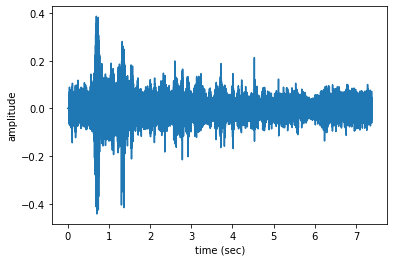

In [ ]:
n=1000                                                             # audio signal amplitude
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
print(x)
print("Are all elements of array x zero? :",np.all((x==0)))
print(fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [ ]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area            campus
spot            square
in_out         outdoor
Participant       S179
Name: 0500.wav, dtype: object

[0. 0. 0. ... 0. 0. 0.]
Are all elements of array x zero? : True
44100


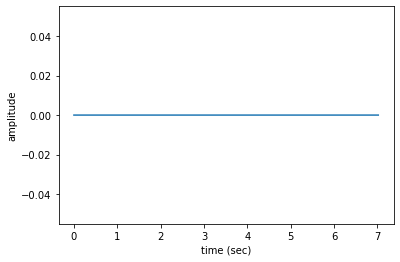

In [ ]:
n=2498                                                         #broken audio signal
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
print(x)
print("Are all elements of array x zero? :",np.all((x==0)))
print(fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))


In [ ]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area           kensington
spot                 pond
in_out            outdoor
Participant          S102
Name: 0033.wav, dtype: object

### Finding Broken Audio Files

The above graph shows a broken audio file which means there is no audio signal recorded and this will give an error while extracting features. 

The next piece of code finds which audio files are broken and then we remove these files from the google drive folder and the csv dataset.

In [ ]:
for n in range(0,2500):                                                 # to find which audio signal is broken
  fs = None # Sampling frequency
  x, fs = librosa.load(files[n],sr=fs)
  
  if np.all((x==0))==True:
    print("n=",n)
    print(MLENDLS_df.loc[files[n].split('/')[-1]],"\n")
  

n= 2498
area           kensington
spot                 pond
in_out            outdoor
Participant          S102
Name: 0033.wav, dtype: object 

n= 2499
area            campus
spot            square
in_out         outdoor
Participant       S102
Name: 2206.wav, dtype: object 



From the above output, there are two broken files both of participant S102
with names 0033.wav and 2206.wav.

The next step is to delete these from the google drive folder and reload the audio files as shown below. We can observe that the length of the audio files are deleted and reduced by 2.

In [ ]:
sample_path = '/content/drive/MyDrive/ML_miniproject_data/MLEndLS/sample/MLEndLS/*.wav'
files_new = glob.glob(sample_path)
len(files_new)

2498

In [ ]:
MLENDLS_df_new = pd.read_csv('MLEndLS.csv')                           # deleting rows in dataframe with audio files 0033.wav and 2206.wav
MLENDLS_df_new.drop( index=[32,2205],inplace=True)
MLENDLS_df_new=MLENDLS_df_new.set_index('file_id') 
MLENDLS_df_new[30:35]

,area,spot,in_out,Participant
file_id,,,,
0031.wav,kensington,dinosaur,indoor,S72
0032.wav,british,greatcourt,indoor,S162
0034.wav,westend,national,indoor,S144
0035.wav,campus,library,outdoor,S27
0036.wav,southbank,skate,outdoor,S111


### Feature Extraction

To extract features from audio file such as Power , Pitch-mean , Pitch-Standard Deviation, Fraction of Voiced Region, we will use the getXy and getPitch functions which will store the audio features and its corresponding labels into an array format, which will be used for model assessment and prediction.

In [ ]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [ ]:
def getXy(files_new,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files_new):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [ ]:
if False:
  X,y = getXy(files_new, labels_file=MLENDLS_df_new, scale_audio=True, onlySingleDigit=True)

100%|██████████| 2498/2498 [1:09:26<00:00,  1.67s/it]


In [ ]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))
print('The Unique values of y is',np.unique(y))

The shape of X is (2498, 4)
The shape of y is (2498,)
 The number of indoor recordings is  1181
 The number of outdoor recordings is  1317


The above dataset displays that the number of indoor data less than outdoor data, which implies there is slight data imbalance. Also each input has 4 features which will be fed to the pipeline and the output labels True which denote Indoors and False which denoted Outdoors.

The below code is used to save the features and labels after feature extraction into a numpy file. This step is used as a backup as we wont need to perform feature extraction each time we run the notebook as it is a time consuming process.

In [ ]:

if False:

  file= open("X_feat.npy","wb")                #saving audio features to npy file to current directory
  np.save(file,X)
  file.close

  file= open("y_feat.npy","wb")                #saving audio labels to npy file to current directory
  np.save(file,y)
  file.close

In [17]:
file= open("X_feat.npy","rb")                #load audio features to npy file
X1=np.load(file)

file= open("y_feat.npy","rb")                #load audio labels to npy file
y1=np.load(file)

print('The shape of X is', X1.shape) 
print('The shape of y is', y1.shape)

The shape of X is (2498, 4)
The shape of y is (2498,)


### Train-Test Split
 The training and test data are splitted with a ratio of 7:3
 

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X1,y1,test_size=0.3,random_state=0)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

print("length of test set:",len(X_val))
print("length of training set:",len(X_train))

length of test set: 750
length of training set: 1748


### Finding the Best model

In [ ]:
# Hyperparameter Optimization

import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

svm_param= { 'kernel':('linear','rbf'), 'C':[0.1,50,100], 'gamma':[1,'auto']}
log_param = { 'C':[1,0.001] }
knn_param = { 'n_neighbors':[3,5,7] , 'weights':('uniform','distance')}

grid_svm= GridSearchCV(estimator=SVC() , param_grid= svm_param ,scoring='f1', cv=10,verbose=1)            #SVM Gridsearch
s=grid_svm.fit(X_train,y_train)
print("best hyperparameter of svm:",s.best_params_)
print("best svm score using 10 fold CrossValidation:",grid_svm.best_score_ ,"\n")


grid_log= GridSearchCV(estimator=LogisticRegression() , param_grid= log_param ,scoring='f1', cv=10,verbose=1)  #Logistic Regression Gridsearch
lr=grid_log.fit(X_train,y_train)
print("best hyperparameter of logistic regression:",lr.best_params_)
print("best logistic regression score using 10 fold CrossValidation:",grid_log.best_score_ ,"\n")

grid_knn= GridSearchCV(estimator=KNeighborsClassifier() , param_grid= knn_param ,scoring='f1', cv=10,verbose=1)  #KNN Gridsearch
k=grid_knn.fit(X_train,y_train)
print("best hyperparameter of KNN:",k.best_params_)
print("best KNN score using 10 fold CrossValidation:",grid_knn.best_score_ ,"\n")

best_model=[s,lr,k]

grid_dict = {0: 'SVM', 1: 'Logistic Regression',2: 'KNN'}

# Fit the gridsearch of various models
best_sc=0.0
best_classifier=0

grid_score=[]
grid_hyp=[]
for i,model in enumerate(best_model):

  grid_score.append(model.best_score_)
  grid_hyp.append(model.best_params_)
  i+=i

  if i>len(best_model):
    for j,mod in enumerate(best_model):
      
      if grid_score[j]> best_sc:
        best_sc= grid_score[j]
        best_grid=grid_hyp[j]
        best_classifier=j

print('Best Classifier:{}'.format(grid_dict[best_classifier]))
print('Hyperparameter of the best classifier:{}'.format(best_grid))

Fitting 10 folds for each of 12 candidates, totalling 120 fits
best hyperparameter of svm: {'C': 50, 'gamma': 'auto', 'kernel': 'rbf'}
best svm score using 10 fold CrossValidation: 0.4466579751291704 

Fitting 10 folds for each of 2 candidates, totalling 20 fits
best hyperparameter of logistic regression: {'C': 1}
best logistic regression score using 10 fold CrossValidation: 0.39244793658225563 

Fitting 10 folds for each of 6 candidates, totalling 60 fits
best hyperparameter of KNN: {'n_neighbors': 3, 'weights': 'distance'}
best KNN score using 10 fold CrossValidation: 0.5122942811233189 

Best Classifier:KNN
Hyperparameter of the best classifier:{'n_neighbors': 3, 'weights': 'distance'}


### Pipeline Implementation on Test data


In [23]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score

pipe=Pipeline([ ('minmax',MinMaxScaler()) , ('KNN',KNeighborsClassifier(n_neighbors=3, weights='distance')) ])
pipe.fit(X_train,y_train)
print("Accuracy of Training data using best hyperparameter:",pipe.score(X_train,y_train))
print("Accuracy of Test Data using best hyperparameter:",pipe.score(X_val,y_val))
print("F1_score of Best Model Test data : ",f1_score(y_val,pipe.predict(X_val)))

Accuracy of Training data using best hyperparameter: 1.0
Accuracy of Test Data using best hyperparameter: 0.5466666666666666
F1_score of Best Model Test data :  0.501466275659824


### Confusion Matrix

The best ML model is found to be the KNN classifier for the MLEndLS dataset. The model is evaluated from the confusion matrix given.

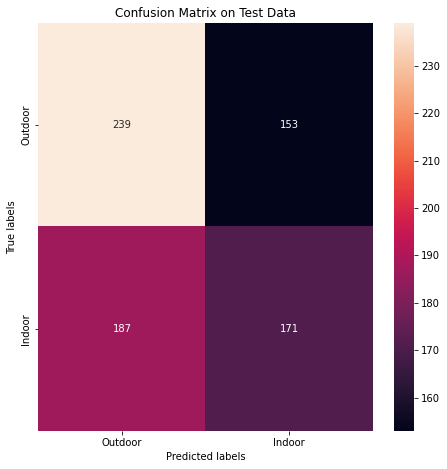

In [ ]:
from sklearn.metrics import confusion_matrix,plot_confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(y_val,pipe.predict(X_val))

fig, ax = plt.subplots(figsize=(7.5, 7.5))
sns.heatmap(cm, annot=True, fmt='g', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix on Test Data')
ax.xaxis.set_ticklabels(['Outdoor', 'Indoor'])                # 1-->Indoors , 0-->Outdoors
ax.yaxis.set_ticklabels(['Outdoor', 'Indoor'])
plt.show()

In [22]:
tp=171
tn=239
fp=153
fn=187
acc= (tp+tn)/(tp+tn+fp+fn)
prec=tp/(tp+fp)
rec= tp/(tp+fn)
f1= 2*tp/(2*tp+fp+fn)
print("Confusion Matrix Accuracy=",acc)
print("Confusion Matrix Precision=",prec)
print("Confusion Matrix Recall=",rec)
print("Confusion Matrix F1 Score=",f1)

Confusion Matrix Accuracy= 0.5466666666666666
Confusion Matrix Precision= 0.5277777777777778
Confusion Matrix Recall= 0.4776536312849162
Confusion Matrix F1 Score= 0.501466275659824


From the confusion matrix of test data,the value of true positive and true negative are 239 and 171 whereas the value of False negative and False positive are 187 and 153.

This implies that its almost equally likely the model will predict the test data correctly or incorrectly from the metrics calculation above as F1 score is 58.43%, which means 58% likely to predict data correctly wrt its ground truth label.

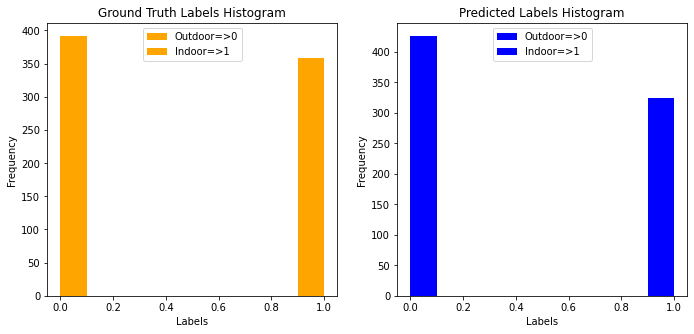

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

y_pred=pipe.predict(X_val)
y_p=y_pred.astype(int)
y_gt=y_val.astype(int)

plt.figure(figsize=[10,5])

plt.subplot(1,2,1)
plt.hist(y_gt,color= 'orange' ,label=['Outdoor','Indoor'])
plt.title("Ground Truth Labels Histogram")
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.legend(['Outdoor=>0','Indoor=>1 '] , loc='upper center')

plt.subplot(1,2,2)
plt.hist(y_p,color= 'blue' ,label=['Outdoor','Indoor'])
plt.title("Predicted Labels Histogram")
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.legend(['Outdoor=>0','Indoor=>1 '] , loc='upper center')

plt.tight_layout(pad=2.0)
plt.show()

The above histogram plots histogram for Ground Truth Labels and Predicted Labels. Comparing the plots, the predicted labels for outdoor labels is more than ground truth labels whereas for indoor labels the predicted labels is less than ground truth labels.This suggests that the classifier classified certain points as false negative and false positive.

# 8 Results
Predicting 10 samples of test data using the best ML model. 
Below code shows the predicted labels against the ground truth labels where 
True implies indoors and False denotes Outdoors.

In [12]:
#predicting the first 10 test data
print("Predicted labels:",pipe.predict(X_val[0:10]))
print("Ground Truth labels:",y_val[0:10])

Predicted labels: [ True  True False False  True False False  True  True  True]
Ground Truth labels: [False  True  True False  True  True  True False False False]


# 9 Conclusion

Using the GridSearchCV function, the best ML model is the KNN classifier with n_neighbors=3 amd weight=distance Hyperparameters and F1 score across 10 Fold Cross Validation is 58.43%.

The score metric used in this analysis is the F1 score as the dataset is imbalanced inwhich the number of indoor recordings is  1181 and the number of outdoor recordings is  1317. The F1 score is better metric for imbalanced data over the Accuracy metric which is preferred in the case of balanced data.

Although the training score is 100% but the test pipeline score(accuracy) for the best model is 54.6% and the f1 score is 50.14%, which leans towards the concept of overfitting which may be because hyperparameters values considered are not good enough and experimenting on more values could give better performance compared to the ones considered during the GridSearchCV function. 

Also more ML models like Naive Bayes,Decision Tree, Random Forest etc could be implemented to evaluate the best model and improve the score metric.

